In [250]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

In [251]:
df_radiografias = pd.read_csv('../../datasets/covid/usable/train/train.csv')
df_radiografias['target'] = LabelEncoder().fit_transform(df_radiografias['class'])
df_radiografias['path'] = df_radiografias['filename'].apply(lambda x: f'../../datasets/covid/usable/train/radiografias/{x}')
df_radiografias.head()

,filename,patient_id,class,data_source,x1,y1,x2,y2,confidence,target,path
0,sub-S308658_ses-E30977_run-1_bp-chest_vp-ap_dx...,S308658,positive,bimcv,0.431250,0.546875,0.862500,0.875000,0.740234,1,../../datasets/covid/usable/train/radiografias...
1,sub-S333807_ses-E70861_run-1_bp-chest_vp-pa_cr...,S333807,positive,bimcv,0.517187,0.410937,0.765625,0.665625,0.898926,1,../../datasets/covid/usable/train/radiografias...
2,sub-S329071_ses-E58766_run-1_bp-chest_vp-pa_cr...,S329071,positive,bimcv,0.567187,0.428125,0.809375,0.818750,0.937500,1,../../datasets/covid/usable/train/radiografias...
3,sub-S308216_ses-E24755_run-1_bp-chest_vp-ap_dx...,S308216,positive,bimcv,0.485938,0.367188,0.865625,0.578125,0.738770,1,../../datasets/covid/usable/train/radiografias...
4,sub-S318051_ses-E37347_run-1_bp-chest_vp-pa_cr...,S318051,positive,bimcv,0.535937,0.473437,0.890625,0.678125,0.854004,1,../../datasets/covid/usable/train/radiografias...


In [252]:
from sklearn.model_selection import train_test_split
df_radiografias_train, df_radiografias_test = train_test_split(df_radiografias, test_size=0.2, random_state=0, stratify=df_radiografias['data_source'])
df_radiografias_train.reset_index(drop=True, inplace=True)
df_radiografias_test.reset_index(drop=True, inplace=True)

In [253]:
print(df_radiografias_train.shape)

(9600, 11)


In [254]:
print(df_radiografias_test.shape)

(2400, 11)


In [255]:
def visualize_image(image_path):
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    img = mpimg.imread(image_path)
    plt.imshow(img, cmap='gray')
def pick_image(df, random_state=None, positive=None, n_images=1):
    df_sampled = df.sample(frac=1, random_state=random_state)
    if positive == 1:
        df_filtered = df_sampled[df_sampled['target'] == 1]
    elif positive == 0:
        df_filtered = df_sampled[df_sampled['target'] == 0]
    else:
        df_filtered = df_sampled
    images = df_filtered.head(n_images)
    return images['path'].tolist(), images['target'].tolist(), images.index.tolist()

def show_image(df, random_state=None, positive=None):
    import matplotlib.pyplot as plt
    image_path, target,_ = pick_image(df,random_state, positive)
    visualize_image(image_path[0])
    plt.title(f'target: {target[0]}')
def show_images(df, dimension=None, random_state=None, positive=None):
    if dimension is None:
        show_image(df, random_state, positive)
    else:
        import matplotlib.pyplot as plt
        import matplotlib.image as mpimg
        k = 2
        _, axs = plt.subplots(dimension[0], dimension[1],figsize=(k*dimension[1],k*dimension[0]))
        images_paths,targets,_ = pick_image(df, random_state, positive, dimension[0]*dimension[1])
        for i in range(dimension[0]):
            for j in range(dimension[1]):
                if i*dimension[1]+j >= len(images_paths):
                    break
                img = mpimg.imread(images_paths[i*dimension[1]+j])
                axs[i, j].imshow(img, cmap='gray')
                axs[i, j].set_title(f'target: {targets[i*dimension[1]+j]}')
                axs[i, j].axis('off')
        plt.show()
def compare_images(df,dimensions=(2,2),random_state=None, split=False):
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    if dimensions[1] % 2 != 0:
        raise ValueError('The second dimension must be an even number')
    total_images = dimensions[0]*dimensions[1]
    positive_images = total_images//2
    negative_images = total_images//2
    positive_paths, positive_targets,_ = pick_image(df, random_state, positive=1, n_images=positive_images)
    negative_paths, negative_targets,_ = pick_image(df, random_state, positive=0, n_images=negative_images)
    k=3
    fig, axs = plt.subplots(dimensions[0], dimensions[1], figsize=(k*dimensions[1],k*dimensions[0]))
    if split:
        for i in range(dimensions[0]):
            for j in range(dimensions[1] // 2):
                img = mpimg.imread(positive_paths[i * (dimensions[1] // 2) + j])
                axs[i, j].imshow(img, cmap='gray')
                axs[i, j].set_title(f'target: {positive_targets[i * (dimensions[1] // 2) + j]}')
                axs[i, j].axis('off')
            for j in range(dimensions[1] // 2, dimensions[1]):
                img = mpimg.imread(negative_paths[i * (dimensions[1] // 2) + (j - dimensions[1] // 2)])
                axs[i, j].imshow(img, cmap='gray')
                axs[i, j].set_title(f'target: {negative_targets[i * (dimensions[1] // 2) + (j - dimensions[1] // 2)]}')
                axs[i, j].axis('off')
    else:
        for i in range(dimensions[0]):
            for j in range(dimensions[1]):
                if (i * dimensions[1] + j) % 2 == 0:
                    img = mpimg.imread(positive_paths[(i * dimensions[1] + j) // 2])
                    axs[i, j].imshow(img, cmap='gray')
                    axs[i, j].set_title(f'target: {positive_targets[(i * dimensions[1] + j) // 2]}')
                else:
                    img = mpimg.imread(negative_paths[(i * dimensions[1] + j) // 2])
                    axs[i, j].imshow(img, cmap='gray')
                    axs[i, j].set_title(f'target: {negative_targets[(i * dimensions[1] + j) // 2]}')
                axs[i, j].axis('off')
    plt.show()

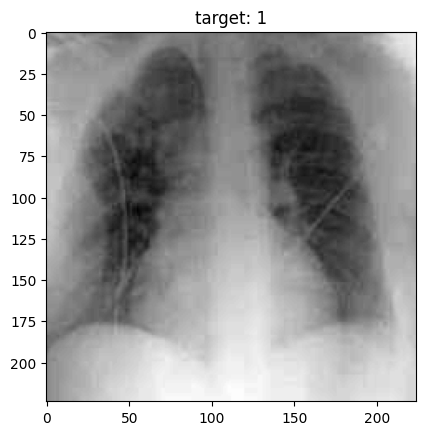

In [256]:
show_image(df_radiografias_train,random_state=1, positive=1)

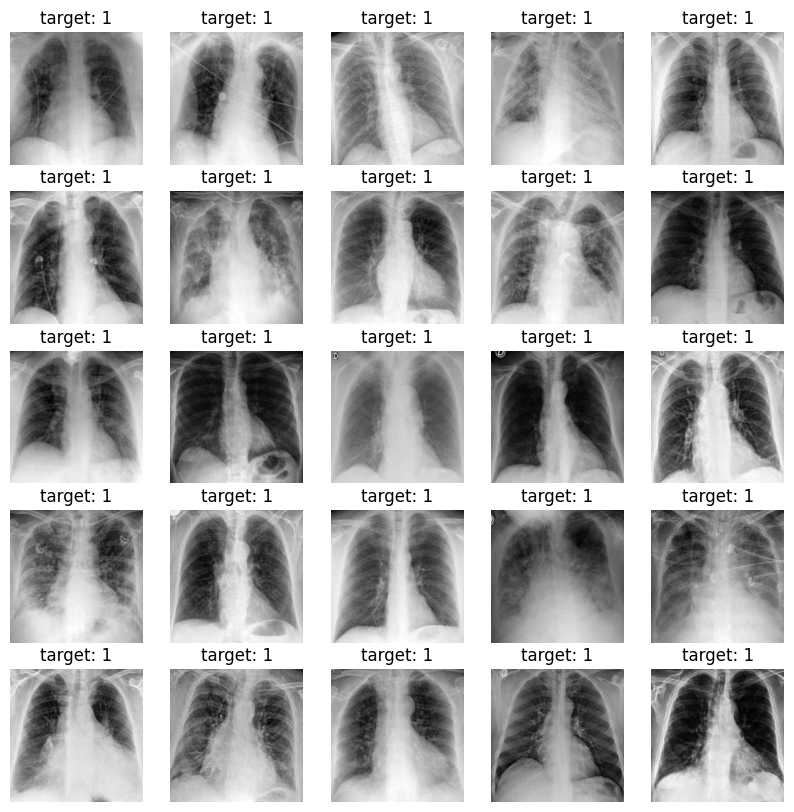

In [257]:
show_images(df_radiografias_train, dimension=(5,5), random_state=1, positive=1)

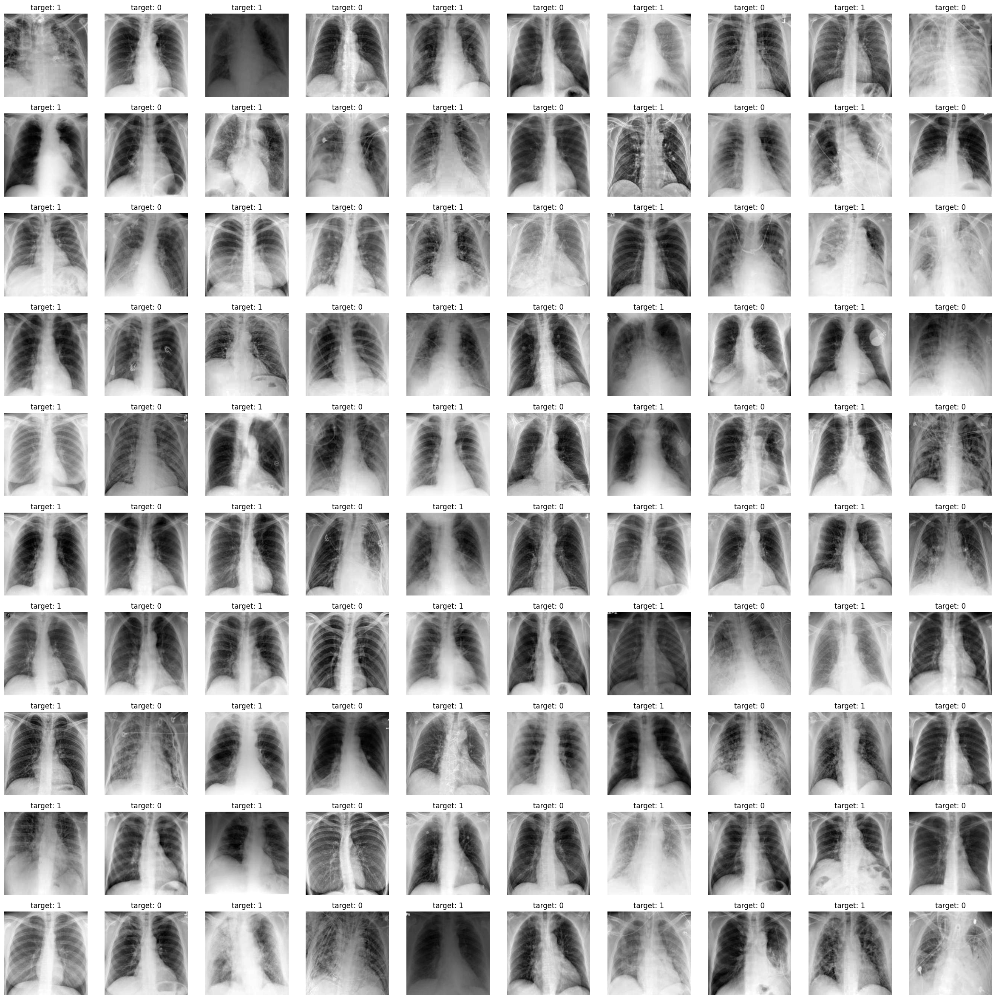

In [258]:
compare_images(df_radiografias_train, dimensions=(10,10), random_state=20, split=False)

## DBSCAN Anomalias

In [259]:
def make_dataset(df, random_state=None,n_images=1000):
    from PIL import Image
    import numpy as np
    print(df.shape)
    images_paths, targets, indexs = pick_image(df, random_state=random_state, n_images=n_images)
    images = []
    for image_path in images_paths:
        img = Image.open(image_path).convert('L')
        img = img.resize((224,224))
        img = np.array(img).flatten()
        images.append(img)
    images = np.array(images)
    targets = np.array(targets)
    return images, targets, indexs

In [260]:
X, y, indices = make_dataset(df_radiografias_train, random_state=290, n_images=500)

(9600, 11)


eps=6600.0, anomalías=67
eps=6634.482758620689, anomalías=66
eps=6668.9655172413795, anomalías=64


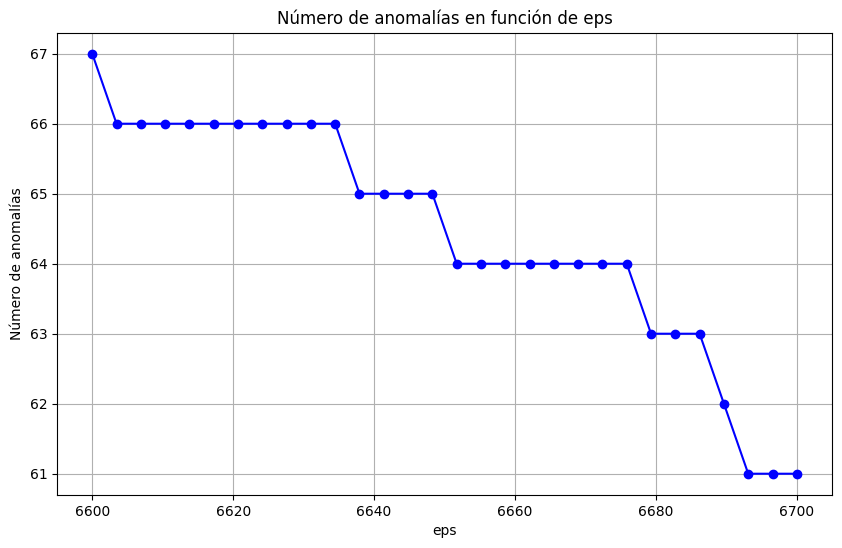

In [261]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import numpy as np

# Escalar los datos

# Rango de eps a probar
eps = np.linspace(6600,6700, 30)

# Variables para el mejor eps
cantidad_anomalias = []
ep = 1
N = 20
dbscan = None
# Iterar sobre eps
for e,i in zip(eps, range(len(eps))):
    dbscan = DBSCAN(eps=e, min_samples=N, n_jobs=-1)
    dbscan.fit(X)
    anomalias = np.sum(dbscan.labels_ == -1)  # Corregir cálculo de anomalías
    if i % 10 == 0:
        print(f'eps={e}, anomalías={anomalias}')
    cantidad_anomalias.append(anomalias)

import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(eps, cantidad_anomalias, marker='o', linestyle='-', color='b')
plt.xlabel('eps')
plt.ylabel('Número de anomalías')
plt.title('Número de anomalías en función de eps')
plt.grid()
plt.show()

# # Ajustar DBSCAN con el mejor eps
# dbscan = DBSCAN(eps=ep, min_samples=N)
# dbscan.fit(X_scaled)

# # Agregar etiquetas al DataFrame
# df_radiografias_anomalias = df_radiografias_train.loc[indices]
# df_radiografias_anomalias['cluster'] = dbscan.labels_
# df_radiografias_anomalias = df_radiografias_anomalias[df_radiografias_anomalias['cluster'] == -1]

# # Imprimir resultados
# print("Número de anomalías detectadas:", df_radiografias_anomalias.shape[0])
# df_radiografias_anomalias.head()

In [262]:
dbscan = DBSCAN(eps = 6668.9655172413795, min_samples=N, n_jobs=-1)
dbscan.fit(X)
df_radiografias_anomalias = df_radiografias_train.loc[indices]
df_radiografias_anomalias['cluster'] = dbscan.labels_
df_radiografias_anomalias = df_radiografias_anomalias[df_radiografias_anomalias['cluster'] == -1]

# Imprimir resultados
print("Número de anomalías detectadas:", df_radiografias_anomalias.shape[0])

Número de anomalías detectadas: 64


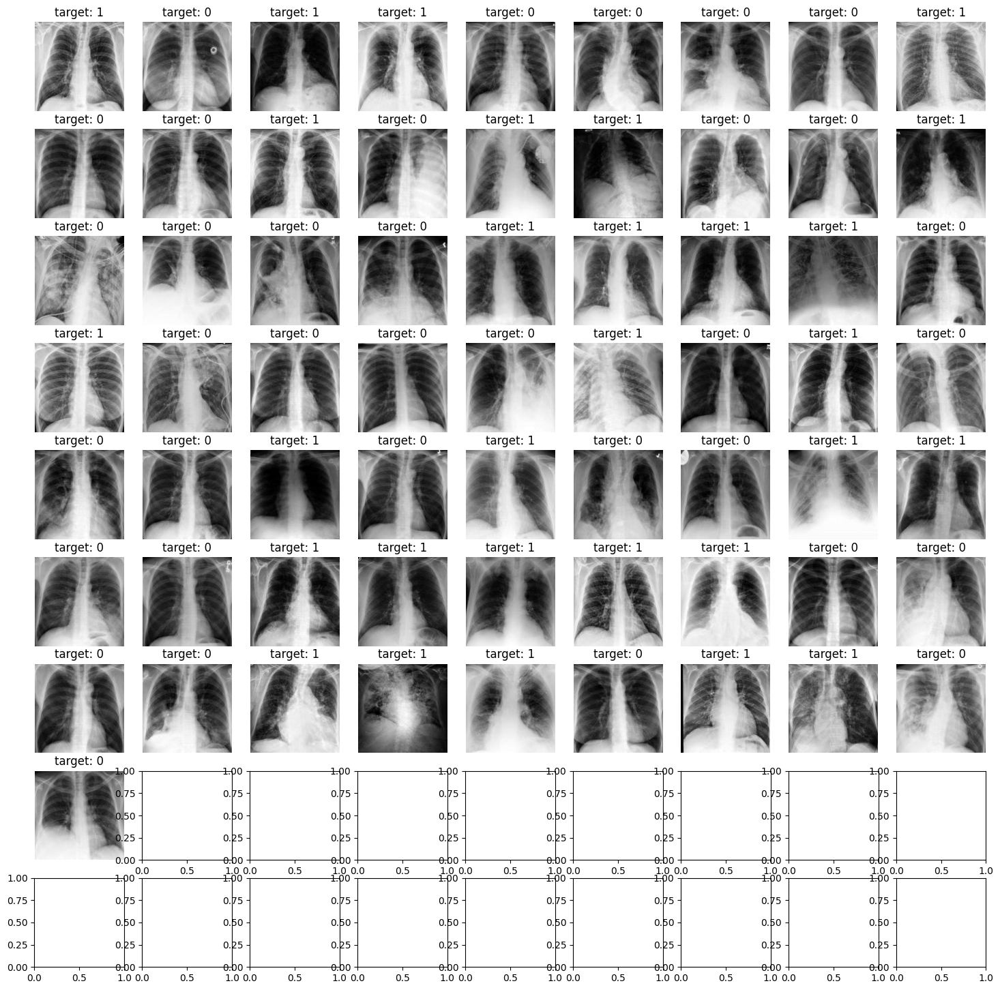

In [263]:
show_images(df_radiografias_anomalias, dimension=(9,9))

In [271]:
def mostrar_conjunto_dbscan( df_radiografias,random_state = 1,n_images=500):
    # prediciones de anomalías con DBSCAN
    X,_,indices = make_dataset(df_radiografias, random_state=random_state, n_images=n_images)
    dbscan = DBSCAN(eps=6668.9655172413795, min_samples=N, n_jobs=-1)
    dbscan.fit(X)
    df_radiografias_anomalias = df_radiografias.loc[indices]
    df_radiografias_anomalias['cluster'] = dbscan.labels_
    df_radiografias_anomalias = df_radiografias_anomalias[df_radiografias_anomalias['cluster'] == -1]
    anomalias = df_radiografias_anomalias.shape[0]
    n = int(np.floor(np.sqrt(anomalias)))
    if n % 2 != 0:
        n += 1

    show_images(df_radiografias_anomalias, dimension=(n,n))

(2400, 11)


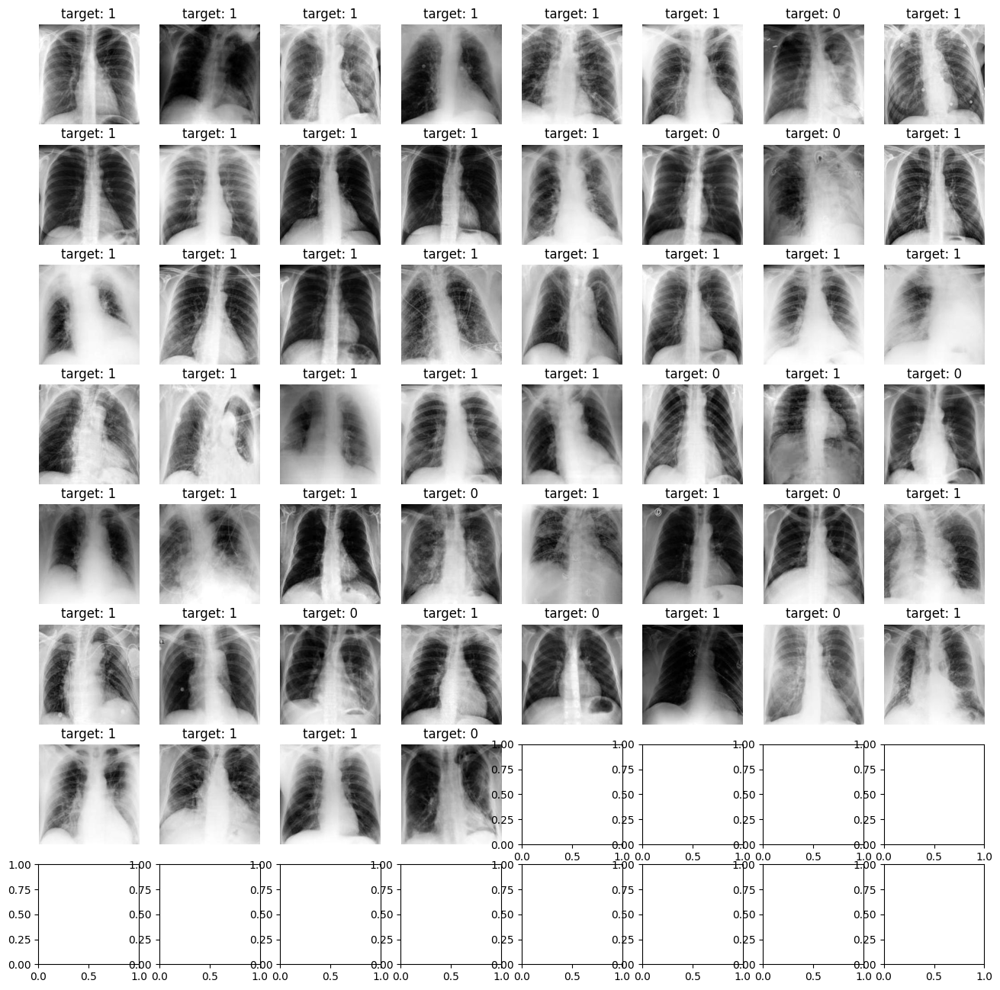

In [272]:
mostrar_conjunto_dbscan(df_radiografias_test,random_state=1,n_images=500)

(2400, 11)


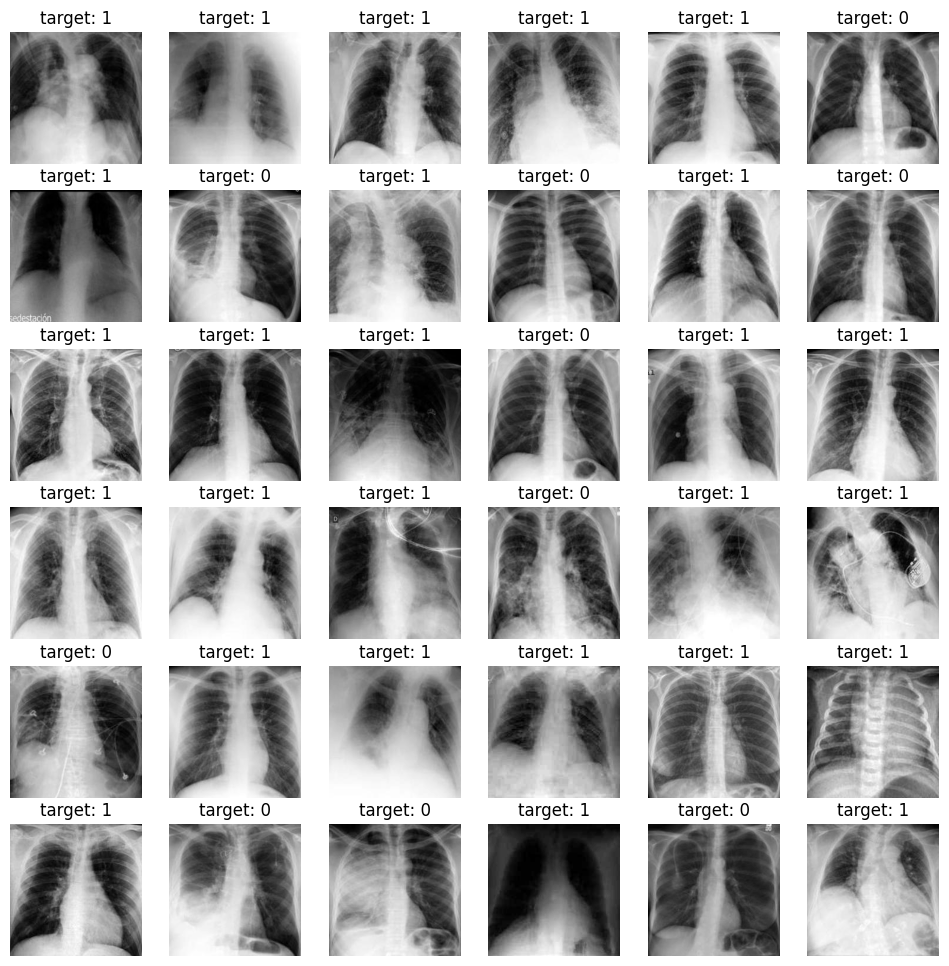

In [266]:
mostrar_conjunto_dbscan(df_radiografias_test,random_state=2,n_images=500)

(2400, 11)


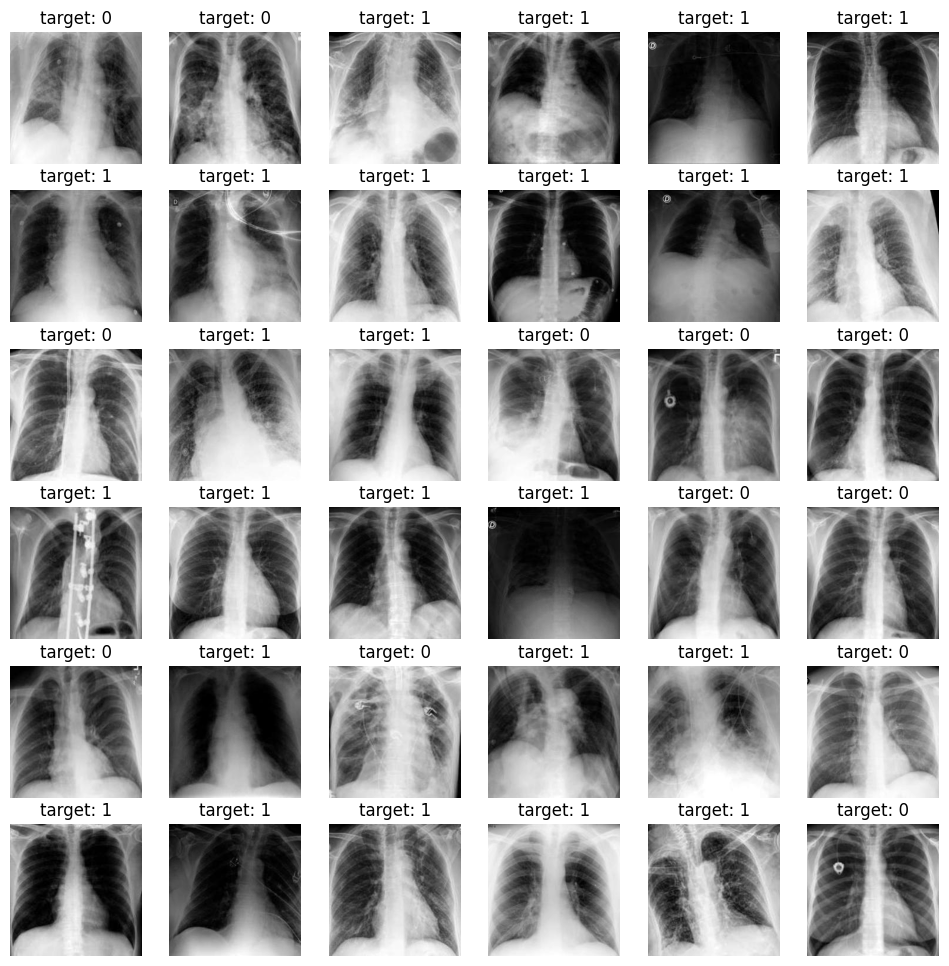

In [267]:
mostrar_conjunto_dbscan(df_radiografias_test,random_state=3,n_images=500)

(2400, 11)


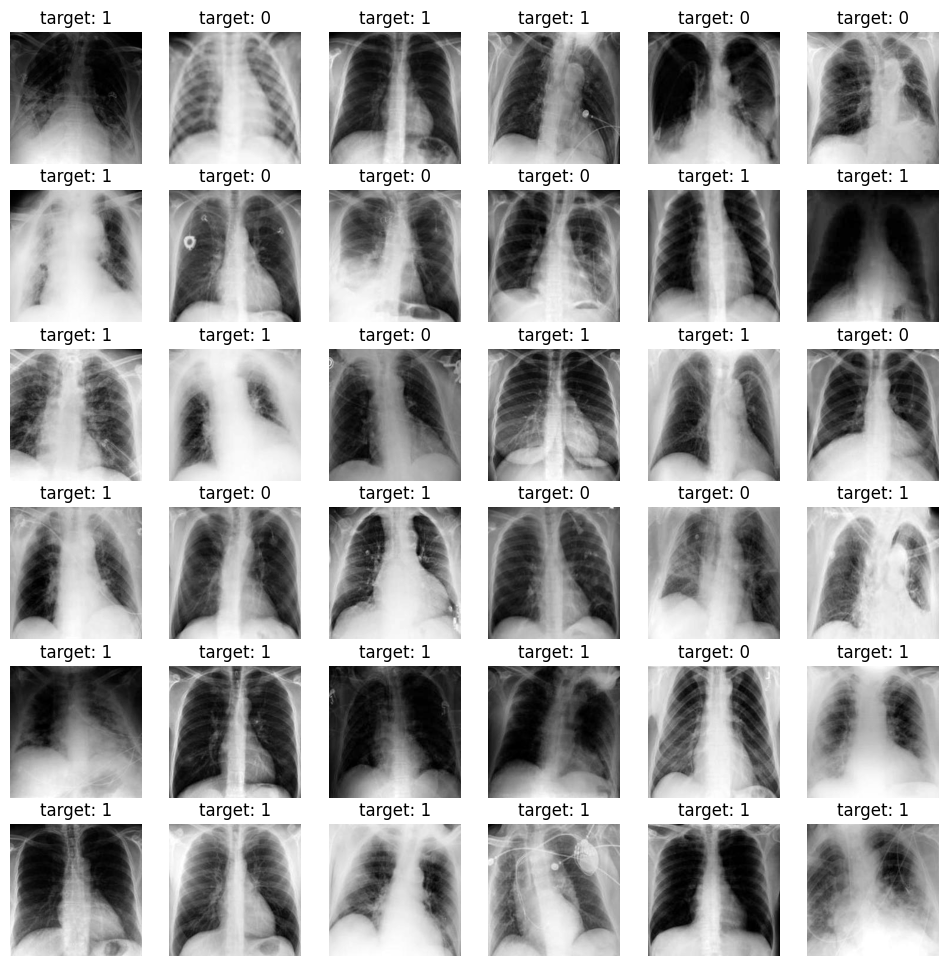

In [269]:
mostrar_conjunto_dbscan(df_radiografias_test,random_state=50,n_images=500)

(9600, 11)


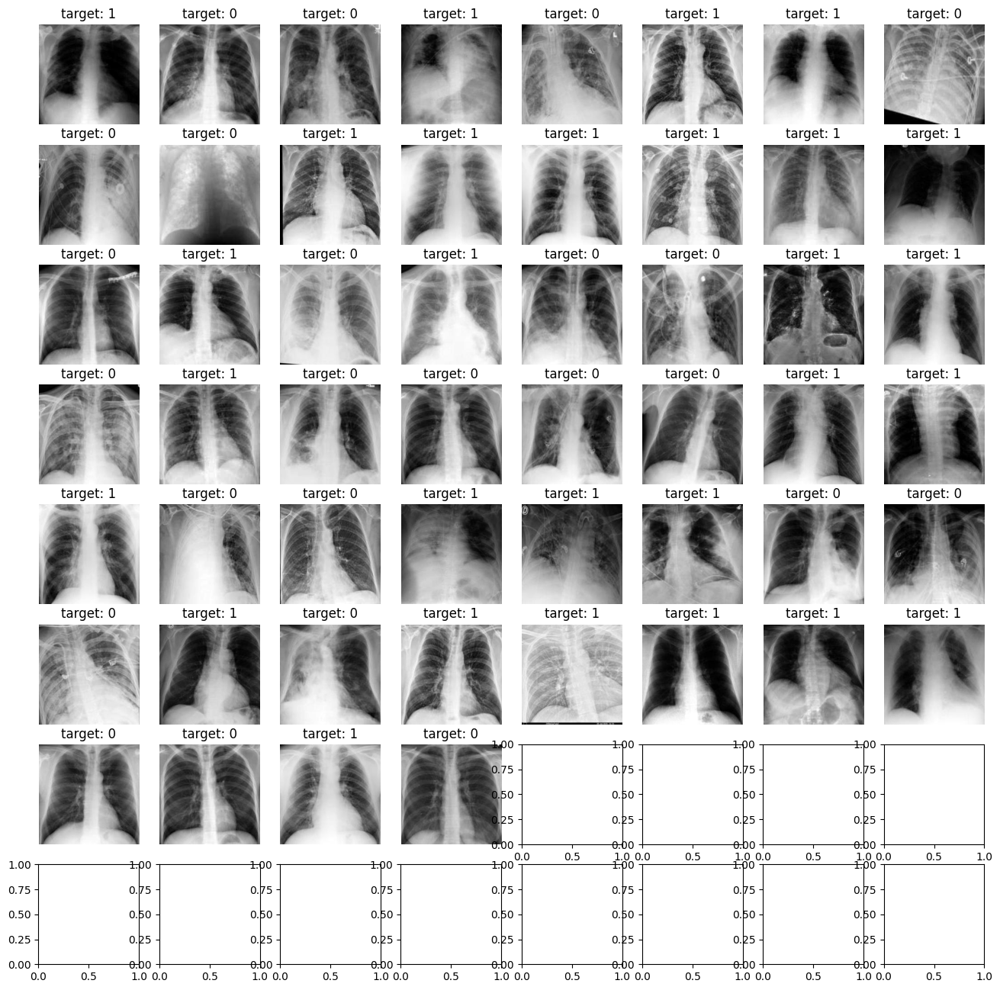

In [273]:
mostrar_conjunto_dbscan(df_radiografias_train,random_state=100,n_images=500)